<a href="https://colab.research.google.com/github/mucherlauma/data-analysis/blob/main/Data_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Data analysis using Python involves several steps and tools. Here is a general overview of the process and some key libraries:

Steps in Data Analysis

**Data Collection:** Gathering data from various sources such as CSV files, databases, APIs, or web scraping.

**Data Cleaning:** Handling missing values, removing duplicates, correcting errors, and ensuring the data is in a usable format.

**Data Exploration:**Understanding the data's structure, summary statistics, and identifying patterns or anomalies.

**Data Visualization:** Creating visual representations to make insights more accessible.

**Data Modeling:**  Applying statistical or machine learning models to make predictions or understand relationships.
Communication: Summarizing and presenting findings through reports, dashboards, or presentations.

**Level-1 Task 1:Top Cuisines**

Determine the top three most common cuisines in the dataset.

Calculate the percentage of restaurants that serve each of the top cuisines.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
from collections import Counter
import pandas as pd
# Load the dataset
file_path = '/content/drive/MyDrive/Dataset .csv'  # Replace with the correct path
data = pd.read_csv(file_path)

# Split the 'Cuisines' column into individual cuisines and count their occurrences
cuisine_counter = Counter()
for cuisines in data['Cuisines'].dropna():
    for cuisine in cuisines.split(', '):
        cuisine_counter[cuisine] += 1

# Get the top three most common cuisines
top_cuisines = cuisine_counter.most_common(3)

# Calculate the percentage of restaurants that serve each of the top cuisines
total_restaurants = len(data)
top_cuisines_percentages = [(cuisine, count, (count / total_restaurants) * 100) for cuisine, count in top_cuisines]

# Display the results
for cuisine, count, percentage in top_cuisines_percentages:
    print(f"{cuisine}: {count} restaurants, {percentage:.2f}% of total")

# If you want to return the results as a list of dictionaries, uncomment the following line:
# top_cuisines_percentages

North Indian: 3960 restaurants, 41.46% of total
Chinese: 2735 restaurants, 28.64% of total
Fast Food: 1986 restaurants, 20.79% of total


**Level 1 Task 2:City Analysis**

Identify the city with the highest number
of restaurants in the dataset.

Calculate the average rating for
restaurants in each city.

Determine the city with the highest
average rating.

In [ ]:
import pandas as pd

# Load the dataset
file_path = '/content/drive/MyDrive/Dataset .csv'
data = pd.read_csv(file_path)

# 1. Identify the city with the highest number of restaurants
city_restaurant_counts = data['City'].value_counts()
city_with_most_restaurants = city_restaurant_counts.idxmax()
num_restaurants_in_top_city = city_restaurant_counts.max()

# 2. Calculate the average rating for restaurants in each city
city_avg_ratings = data.groupby('City')['Aggregate rating'].mean()

# 3. Determine the city with the highest average rating
city_with_highest_avg_rating = city_avg_ratings.idxmax()
highest_avg_rating = city_avg_ratings.max()

# Print the results
print(f"The city with the highest number of restaurants is {city_with_most_restaurants} with {num_restaurants_in_top_city} restaurants.")
print(f"The city with the highest average rating is {city_with_highest_avg_rating} with an average rating of {highest_avg_rating}.")

The city with the highest number of restaurants is New Delhi with 5473 restaurants.
The city with the highest average rating is Inner City with an average rating of 4.9.


**Level 1 Task 3:Price Range Distribution**

Create a histogram or bar chart to
visualize the distribution of price ranges
among the restaurants.

Calculate the percentage of restaurants
in each price range category.


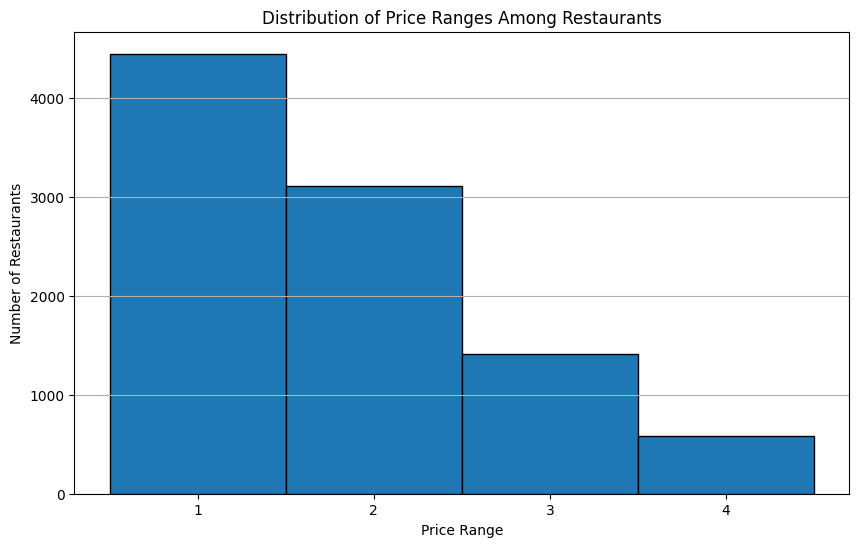

Percentage of restaurants in each price range category:
Price range
1    46.529159
2    32.593446
3    14.741912
4     6.135483
Name: count, dtype: float64


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
# Load the dataset
file_path = '/content/drive/MyDrive/Dataset .csv'
data = pd.read_csv(file_path)

# Ensure 'Price range' column is numeric
data['Price range'] = pd.to_numeric(data['Price range'], errors='coerce')

# Drop rows with missing or invalid 'Price range' values
data = data.dropna(subset=['Price range'])

# 1. Create a histogram to visualize the distribution of price ranges
plt.figure(figsize=(10, 6))
plt.hist(data['Price range'], bins=range(1, 6), align='left', edgecolor='black')
plt.title('Distribution of Price Ranges Among Restaurants')
plt.xlabel('Price Range')
plt.ylabel('Number of Restaurants')
plt.xticks(range(1, 5))
plt.grid(axis='y')
plt.show()

# 2. Calculate the percentage of restaurants in each price range category
price_range_counts = data['Price range'].value_counts().sort_index()
price_range_percentages = (price_range_counts / price_range_counts.sum()) * 100

# Print the percentage of restaurants in each price range category
print("Percentage of restaurants in each price range category:")
print(price_range_percentages)

**Level 1 Task 4:Online Delivery**

Determine the percentage of restaurants
that offer online delivery.

Compare the average ratings of restaurants
with and without online delivery.

In [ ]:
import pandas as pd

# Load the dataset
file_path = '/content/drive/MyDrive/Dataset .csv'
data = pd.read_csv(file_path)

# 1. Determine the percentage of restaurants that offer online delivery
online_delivery_counts = data['Has Online delivery'].value_counts()
total_restaurants = len(data)
online_delivery_percentage = (online_delivery_counts['Yes'] / total_restaurants) * 100

# 2. Compare the average ratings of restaurants with and without online delivery
average_rating_with_delivery = data[data['Has Online delivery'] == 'Yes']['Aggregate rating'].mean()
average_rating_without_delivery = data[data['Has Online delivery'] == 'No']['Aggregate rating'].mean()

# Print the results
print(f"Percentage of restaurants that offer online delivery: {online_delivery_percentage:.2f}%")
print(f"Average rating of restaurants with online delivery: {average_rating_with_delivery:.2f}")
print(f"Average rating of restaurants without online delivery: {average_rating_without_delivery:.2f}")

Percentage of restaurants that offer online delivery: 25.66%
Average rating of restaurants with online delivery: 3.25
Average rating of restaurants without online delivery: 2.47


**Level 2 Task 1:Restaurant Ratings**

Analyze the distribution of aggregate
ratings and determine the most common
rating range.

Calculate the average number of votes
received by restaurants.

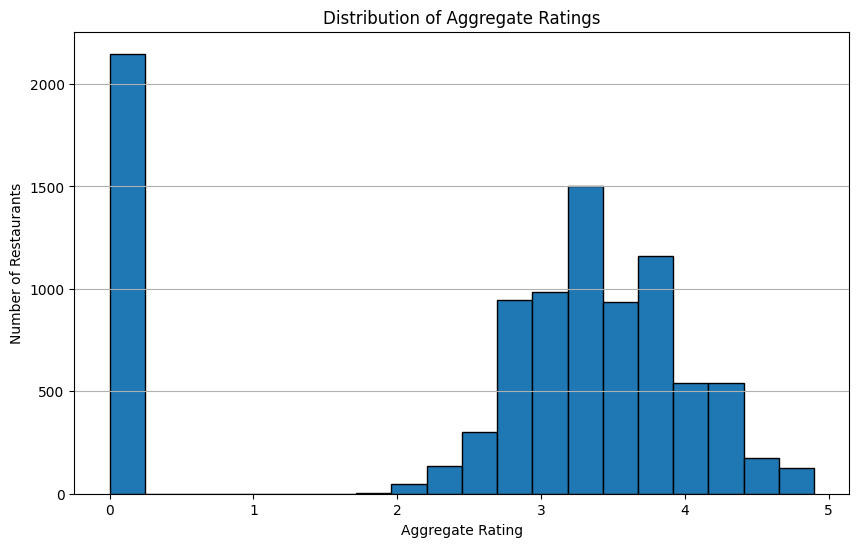

The most common rating range is: 0.0
The average number of votes received by restaurants is: 156.91


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset
file_path = '/content/drive/MyDrive/Dataset .csv'
data = pd.read_csv(file_path)

# 1. Analyze the distribution of aggregate ratings
plt.figure(figsize=(10, 6))
plt.hist(data['Aggregate rating'], bins=20, edgecolor='black')
plt.title('Distribution of Aggregate Ratings')
plt.xlabel('Aggregate Rating')
plt.ylabel('Number of Restaurants')
plt.grid(axis='y')
plt.show()

# 2. Determine the most common rating range
rating_counts = data['Aggregate rating'].value_counts().sort_index()
most_common_rating_range = rating_counts.idxmax()

# 3. Calculate the average number of votes received by restaurants
average_votes = data['Votes'].mean()

# Print the results
print(f"The most common rating range is: {most_common_rating_range}")
print(f"The average number of votes received by restaurants is: {average_votes:.2f}")

**Level 2 Task 2:Cuisine Combination**

Identify the most common combinations of
cuisines in the dataset.

Determine if certain cuisine combinations
tend to have higher ratings.

In [ ]:
import pandas as pd
from collections import Counter
import itertools

# Load the dataset
file_path = '/content/drive/MyDrive/Dataset .csv'
data = pd.read_csv(file_path)

# 1. Identify the most common combinations of cuisines
# Split the 'Cuisines' column by comma and create a list of cuisine combinations
cuisine_combinations = data['Cuisines'].dropna().str.split(', ')
cuisine_combinations = cuisine_combinations.apply(lambda x: tuple(sorted(x)))  # Sort to ensure consistency

# Count the frequency of each combination
combination_counts = Counter(cuisine_combinations)

# Convert to a DataFrame for easier manipulation
combination_counts_df = pd.DataFrame(combination_counts.items(), columns=['Cuisine Combination', 'Count'])
combination_counts_df = combination_counts_df.sort_values(by='Count', ascending=False)

# 2. Determine if certain cuisine combinations tend to have higher ratings
# Create a new column for sorted cuisine combinations
data['Sorted Cuisines'] = data['Cuisines'].dropna().str.split(', ').apply(lambda x: tuple(sorted(x)))

# Group by the sorted cuisine combinations and calculate the mean rating
average_ratings = data.groupby('Sorted Cuisines')['Aggregate rating'].mean().reset_index()
average_ratings.columns = ['Cuisine Combination', 'Average Rating']

# Merge the counts and average ratings dataframes
cuisine_analysis = pd.merge(combination_counts_df, average_ratings, on='Cuisine Combination')

# Print the most common combinations and their average ratings
print("Most Common Cuisine Combinations and Their Average Ratings:")
print(cuisine_analysis.head(10))

Most Common Cuisine Combinations and Their Average Ratings:
                Cuisine Combination  Count  Average Rating
0                   (North Indian,)    936        1.672329
1           (Chinese, North Indian)    616        2.333442
2           (Mughlai, North Indian)    394        2.767259
3                      (Fast Food,)    354        2.118362
4                        (Chinese,)    354        2.042090
5  (Chinese, Mughlai, North Indian)    306        2.619935
6                           (Cafe,)    299        2.890970
7                         (Bakery,)    218        1.924312
8                (Bakery, Desserts)    181        2.375691
9              (Chinese, Fast Food)    159        2.069811


**Level 2 Task 3:Geographic Analysis**

Plot the locations of restaurants on a
map using longitude and latitude
coordinates.

Identify any patterns or clusters of
restaurants in specific areas.

In [ ]:
import pandas as pd
import folium
from folium.plugins import MarkerCluster

# Load the dataset
file_path = '/content/drive/MyDrive/Dataset .csv'
data = pd.read_csv(file_path)

# 1. Filter out rows with missing coordinates
data = data.dropna(subset=['Latitude', 'Longitude'])

# 2. Create an interactive map centered around the average coordinates
center_lat = data['Latitude'].mean()
center_lon = data['Longitude'].mean()
restaurant_map = folium.Map(location=[center_lat, center_lon], zoom_start=12)

# 3. Add markers for each restaurant location
marker_cluster = MarkerCluster().add_to(restaurant_map)

for idx, row in data.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"{row['Restaurant Name']}<br>Rating: {row['Aggregate rating']}",
    ).add_to(marker_cluster)

# Save the map to an HTML file
restaurant_map.save('restaurant_map.html')

# Display the map in Jupyter Notebook (if using Jupyter)
restaurant_map

**Level 2 Task 4:Restaurant Chains**

Identify if there are any restaurant chains
present in the dataset.

Analyze the ratings and popularity of
different restaurant chains.

In [ ]:
import pandas as pd

# Load the dataset
file_path = '/content/drive/MyDrive/Dataset .csv'
data = pd.read_csv(file_path)

# 1. Identify restaurant chains by finding repeated restaurant names
restaurant_counts = data['Restaurant Name'].value_counts()
restaurant_chains = restaurant_counts[restaurant_counts > 1].index.tolist()

# Filter data for only the identified restaurant chains
chains_data = data[data['Restaurant Name'].isin(restaurant_chains)]

# 2. Analyze the ratings and popularity (number of votes) of different restaurant chains
# Group by restaurant name to calculate average ratings and total votes
chain_ratings_votes = chains_data.groupby('Restaurant Name').agg({
    'Aggregate rating': 'mean',
    'Votes': 'sum'
}).reset_index()

# Sort by average rating and total votes
chain_ratings_votes = chain_ratings_votes.sort_values(by=['Aggregate rating', 'Votes'], ascending=[False, False])

# Print the results
print("Restaurant Chains and Their Average Ratings and Total Votes:")
print(chain_ratings_votes)

# Optional: Save the results to a CSV file
chain_ratings_votes.to_csv('restaurant_chains_analysis.csv', index=False)

Restaurant Chains and Their Average Ratings and Total Votes:
               Restaurant Name  Aggregate rating  Votes
629           Talaga Sampireun             4.900   5514
8      AB's Absolute Barbecues             4.850   3151
589           Silantro Fil-Mex             4.850   1364
7    AB's - Absolute Barbecues             4.825  13400
449         Naturals Ice Cream             4.800   3094
..                         ...               ...    ...
440           Murliwala Bakers             0.000      0
538        Rajdhani Restaurant             0.000      0
616                Street Cafe             0.000      0
645              The Big Scoop             0.000      0
713               Whatslife.in             0.000      0

[734 rows x 3 columns]


**Level 3 Task 1:Restaurant Reviews**

Analyze the text reviews to identify the most
common positive and negative keywords.

Calculate the average length of reviews and
explore if there is a relationship between
review length and rating.

   Restaurant ID         Restaurant Name  Country Code              City  \
0        6317637        Le Petit Souffle           162       Makati City   
1        6304287        Izakaya Kikufuji           162       Makati City   
2        6300002  Heat - Edsa Shangri-La           162  Mandaluyong City   
3        6318506                    Ooma           162  Mandaluyong City   
4        6314302             Sambo Kojin           162  Mandaluyong City   

                                             Address  \
0  Third Floor, Century City Mall, Kalayaan Avenu...   
1  Little Tokyo, 2277 Chino Roces Avenue, Legaspi...   
2  Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...   
3  Third Floor, Mega Fashion Hall, SM Megamall, O...   
4  Third Floor, Mega Atrium, SM Megamall, Ortigas...   

                                     Locality  \
0   Century City Mall, Poblacion, Makati City   
1  Little Tokyo, Legaspi Village, Makati City   
2  Edsa Shangri-La, Ortigas, Mandaluyong City   
3      SM 

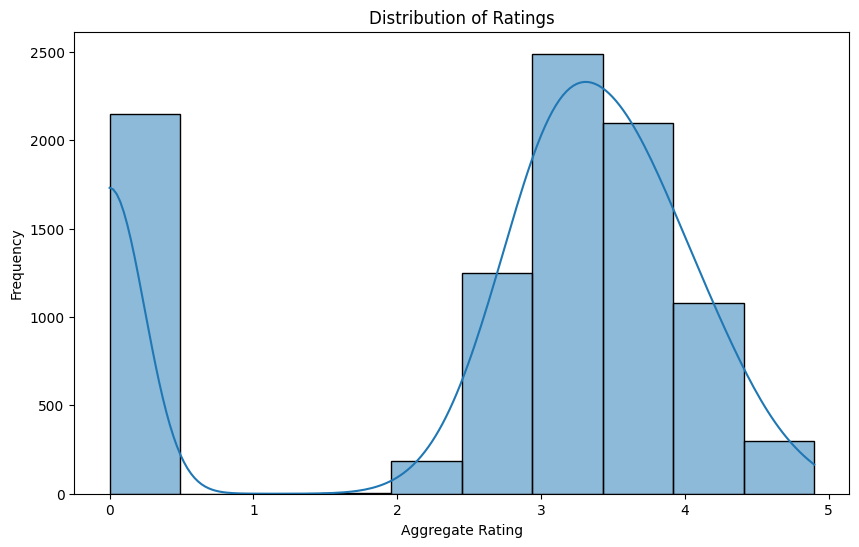

Average Rating: 2.67


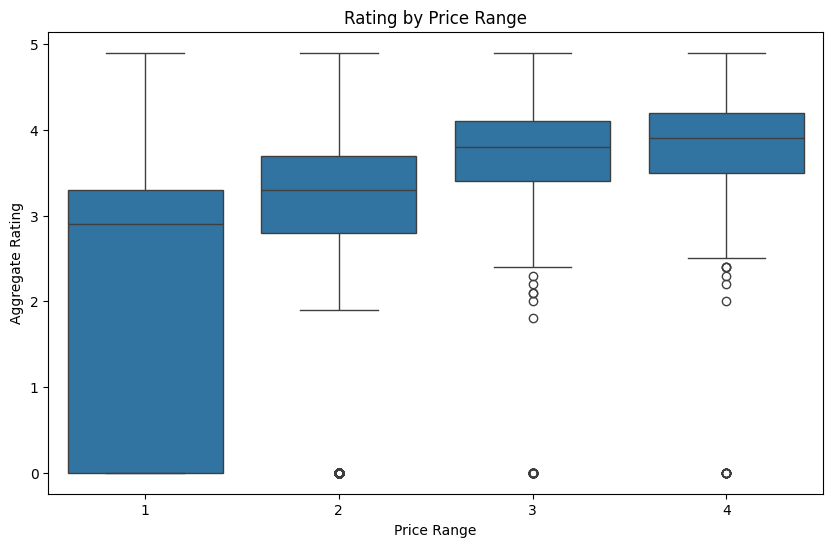

Correlation between Price Range and Aggregate Rating: 0.44


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = '/content/drive/MyDrive/Dataset .csv'
data = pd.read_csv(file_path)

# Display the first few rows of the dataset
print(data.head())

# Plot the distribution of ratings
plt.figure(figsize=(10, 6))
sns.histplot(data['Aggregate rating'], bins=10, kde=True)
plt.title('Distribution of Ratings')
plt.xlabel('Aggregate Rating')
plt.ylabel('Frequency')
plt.show()

# Calculate the average rating
average_rating = data['Aggregate rating'].mean()
print(f'Average Rating: {average_rating:.2f}')

# Plot the relationship between price range and aggregate rating
plt.figure(figsize=(10, 6))
sns.boxplot(x='Price range', y='Aggregate rating', data=data)
plt.title('Rating by Price Range')
plt.xlabel('Price Range')
plt.ylabel('Aggregate Rating')
plt.show()

# Calculate the correlation between price range and aggregate rating
correlation_price_rating = data['Price range'].corr(data['Aggregate rating'])
print(f'Correlation between Price Range and Aggregate Rating: {correlation_price_rating:.2f}')


**Level 3 Task 2:
Votes Analysis**

Identify the restaurants with the highest and
lowest number of votes.

Analyze if there is a correlation between the
number of votes and the rating of a
restaurant.

In [ ]:
import pandas as pd

# Load the dataset
file_path = '/content/drive/MyDrive/Dataset .csv'
data = pd.read_csv(file_path)

# Identify the restaurant with the highest number of votes
highest_votes_restaurant = data.loc[data['Votes'].astype(int).idxmax()]

# Identify the restaurant with the lowest number of votes
lowest_votes_restaurant = data.loc[data['Votes'].astype(int).idxmin()]

# Display the details of the restaurant with the highest number of votes
highest_votes_restaurant_info = highest_votes_restaurant[['Restaurant Name', 'Votes', 'Aggregate rating']]
print("Restaurant with the Highest Number of Votes:")
print(highest_votes_restaurant_info)

# Display the details of the restaurant with the lowest number of votes
lowest_votes_restaurant_info = lowest_votes_restaurant[['Restaurant Name', 'Votes', 'Aggregate rating']]
print("\nRestaurant with the Lowest Number of Votes:")
print(lowest_votes_restaurant_info)

# Analyze the correlation between number of votes and aggregate rating
votes_rating_correlation = data[['Votes', 'Aggregate rating']].astype(float).corr().iloc[0, 1]
print("\nCorrelation between Number of Votes and Aggregate Rating:", votes_rating_correlation)


Restaurant with the Highest Number of Votes:
Restaurant Name      Toit
Votes               10934
Aggregate rating      4.8
Name: 728, dtype: object

Restaurant with the Lowest Number of Votes:
Restaurant Name     Cantinho da Gula
Votes                              0
Aggregate rating                 0.0
Name: 69, dtype: object

Correlation between Number of Votes and Aggregate Rating: 0.31369058419540985


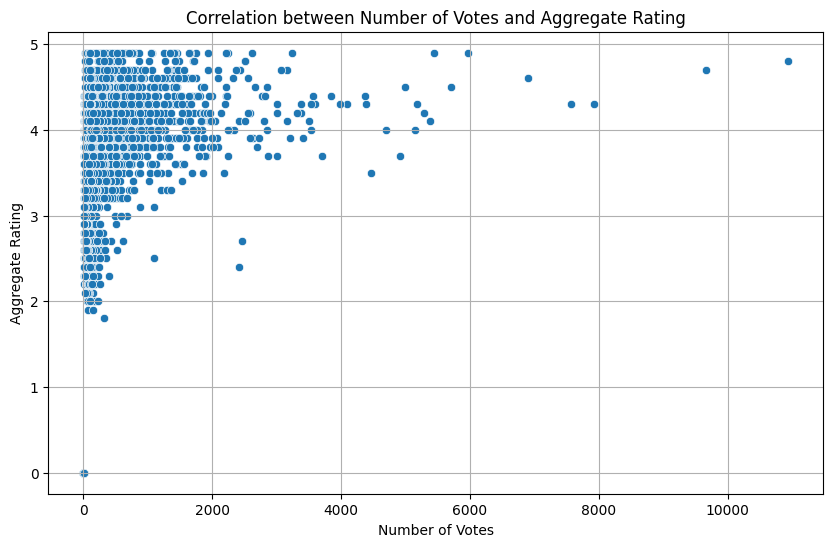

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = '/content/drive/MyDrive/Dataset .csv'
data = pd.read_csv(file_path)

# Convert Votes and Aggregate rating to float for correlation analysis
data['Votes'] = data['Votes'].astype(float)
data['Aggregate rating'] = data['Aggregate rating'].astype(float)

# Plotting the correlation between number of votes and aggregate rating
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Votes', y='Aggregate rating', data=data)
plt.title('Correlation between Number of Votes and Aggregate Rating')
plt.xlabel('Number of Votes')
plt.ylabel('Aggregate Rating')
plt.grid(True)
plt.show()


**Level 3 Task 3:**Price Range vs. Online Delivery and
Table Booking

Analyze if there is a relationship between the
price range and the availability of online
delivery and table booking.

Determine if higher-priced restaurants are
more likely to offer these services.

Average availability of table booking by price range:
Price range
1    0.000225
2    0.076775
3    0.457386
4    0.467577
Name: Has Table booking, dtype: float64

Average availability of online delivery by price range:
Price range
1    0.157741
2    0.413106
3    0.291903
4    0.090444
Name: Has Online delivery, dtype: float64


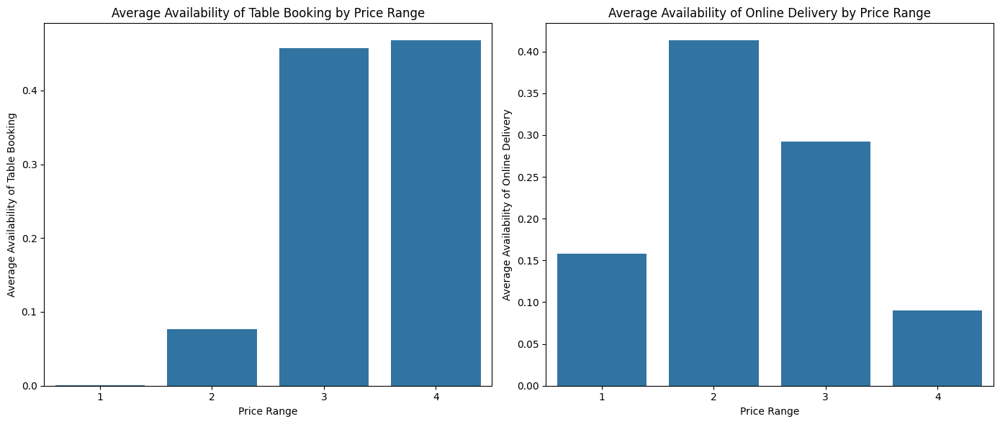

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = '/content/drive/MyDrive/Dataset .csv'
data = pd.read_csv(file_path)

# Convert necessary columns to the appropriate data types
data['Price range'] = data['Price range'].astype(int)
data['Has Table booking'] = data['Has Table booking'].map({'Yes': 1, 'No': 0})
data['Has Online delivery'] = data['Has Online delivery'].map({'Yes': 1, 'No': 0})

# Analyze the relationship between price range and the availability of table booking and online delivery
price_range_table_booking = data.groupby('Price range')['Has Table booking'].mean()
price_range_online_delivery = data.groupby('Price range')['Has Online delivery'].mean()

print("Average availability of table booking by price range:")
print(price_range_table_booking)

print("\nAverage availability of online delivery by price range:")
print(price_range_online_delivery)

# Plotting the relationship
plt.figure(figsize=(14, 6))

# Plot for Table Booking
plt.subplot(1, 2, 1)
sns.barplot(x=price_range_table_booking.index, y=price_range_table_booking.values)
plt.title('Average Availability of Table Booking by Price Range')
plt.xlabel('Price Range')
plt.ylabel('Average Availability of Table Booking')

# Plot for Online Delivery
plt.subplot(1, 2, 2)
sns.barplot(x=price_range_online_delivery.index, y=price_range_online_delivery.values)
plt.title('Average Availability of Online Delivery by Price Range')
plt.xlabel('Price Range')
plt.ylabel('Average Availability of Online Delivery')

plt.tight_layout()
plt.show()
